In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
df = pd.read_csv('/home/hariom/Project/AQI-Predictor/Data/Real-Data/Real_Combine.csv')


In [4]:
df.isnull()


,T,TM,Tm,SLP,H,VV,V,VM,PM 2.5
0,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...
726,False,False,False,False,False,False,False,False,False
727,False,False,False,False,False,False,False,False,False
728,False,False,False,False,False,False,False,False,False
729,False,False,False,False,False,False,False,False,False


In [5]:
df.head()

,T,TM,Tm,SLP,H,VV,V,VM,PM 2.5
0,7.4,9.8,4.8,1017.6,93.0,0.5,4.3,9.4,219.720833
1,7.8,12.7,4.4,1018.5,87.0,0.6,4.4,11.1,182.187500
2,6.7,13.4,2.4,1019.4,82.0,0.6,4.8,11.1,154.037500
3,8.6,15.5,3.3,1018.7,72.0,0.8,8.1,20.6,223.208333
4,12.4,20.9,4.4,1017.3,61.0,1.3,8.7,22.2,200.645833


<Axes: >

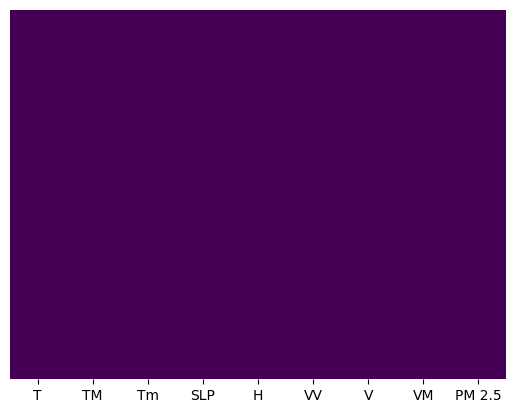

In [6]:
#check for null value
sns.heatmap(df.isnull(),yticklabels=False,cbar=False,cmap='viridis')

In [7]:


X=df.iloc[:,:-1] ## independent features
y=df.iloc[:,-1] ## dependent features



In [8]:


## check null values
X.isnull()



,T,TM,Tm,SLP,H,VV,V,VM
0,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...
726,False,False,False,False,False,False,False,False
727,False,False,False,False,False,False,False,False
728,False,False,False,False,False,False,False,False
729,False,False,False,False,False,False,False,False


In [9]:


y.isnull()



0      False
1      False
2      False
3      False
4      False
       ...  
726    False
727    False
728    False
729    False
730    False
Name: PM 2.5, Length: 731, dtype: bool

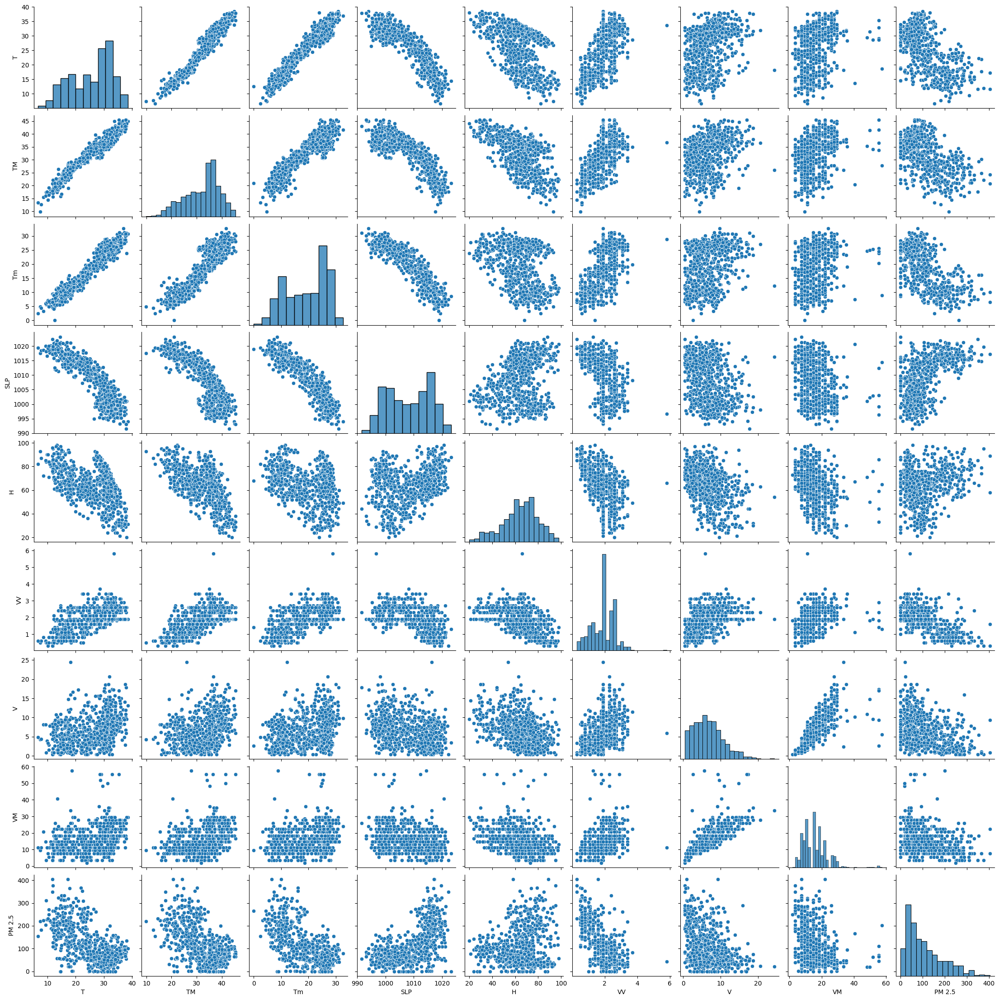

In [10]:


sns.pairplot(df)



In [11]:
df.corr()#uper wale graph ka corelation

,T,TM,Tm,SLP,H,VV,V,VM,PM 2.5
T,1.000000,0.967323,0.958872,-0.884778,-0.520629,0.622441,0.326463,0.287869,-0.628336
TM,0.967323,1.000000,0.896628,-0.829935,-0.601433,0.598028,0.320478,0.300257,-0.569381
Tm,0.958872,0.896628,1.000000,-0.909582,-0.317057,0.560399,0.313298,0.260067,-0.669059
SLP,-0.884778,-0.829935,-0.909582,1.000000,0.277007,-0.491837,-0.346481,-0.300552,0.615615
H,-0.520629,-0.601433,-0.317057,0.277007,1.000000,-0.475249,-0.399293,-0.371552,0.174658
VV,0.622441,0.598028,0.560399,-0.491837,-0.475249,1.000000,0.403044,0.347714,-0.628621
V,0.326463,0.320478,0.313298,-0.346481,-0.399293,0.403044,1.000000,0.760858,-0.354799
VM,0.287869,0.300257,0.260067,-0.300552,-0.371552,0.347714,0.760858,1.000000,-0.283695
PM 2.5,-0.628336,-0.569381,-0.669059,0.615615,0.174658,-0.628621,-0.354799,-0.283695,1.000000


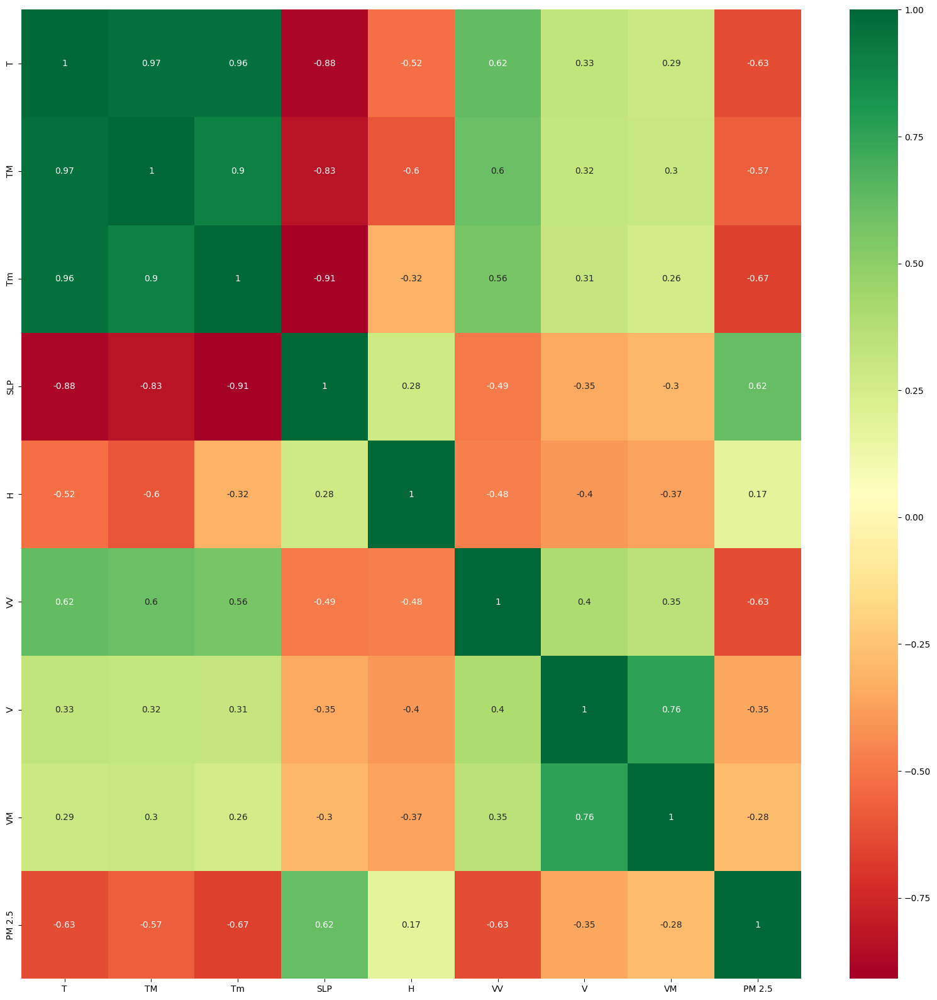

In [12]:


import seaborn as sns
#get correlations of each features in dataset
corrmat = df.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(20,20))
#plot heat map
g=sns.heatmap(df[top_corr_features].corr(),annot=True,cmap="RdYlGn")

In [13]:


corrmat.index



Index(['T', 'TM', 'Tm', 'SLP', 'H', 'VV', 'V', 'VM', 'PM 2.5'], dtype='object')

In [14]:
y = y.fillna(y.mean())  # Replace NaN with mean value


In [15]:
print(X.isnull().sum())  # Check missing values in each column
print(y.isnull().sum())  # Check missing values in target


T      0
TM     0
Tm     0
SLP    0
H      0
VV     0
V      0
VM     0
dtype: int64
0


In [16]:


from sklearn.ensemble import ExtraTreesRegressor
import matplotlib.pyplot as plt
model = ExtraTreesRegressor()
model.fit(X,y)



ExtraTreesRegressor()

In [17]:
X.head()


,T,TM,Tm,SLP,H,VV,V,VM
0,7.4,9.8,4.8,1017.6,93.0,0.5,4.3,9.4
1,7.8,12.7,4.4,1018.5,87.0,0.6,4.4,11.1
2,6.7,13.4,2.4,1019.4,82.0,0.6,4.8,11.1
3,8.6,15.5,3.3,1018.7,72.0,0.8,8.1,20.6
4,12.4,20.9,4.4,1017.3,61.0,1.3,8.7,22.2


In [18]:
print(model.feature_importances_)


[0.15234035 0.07756288 0.14663885 0.15158009 0.0816353  0.29876519
 0.05253375 0.0389436 ]


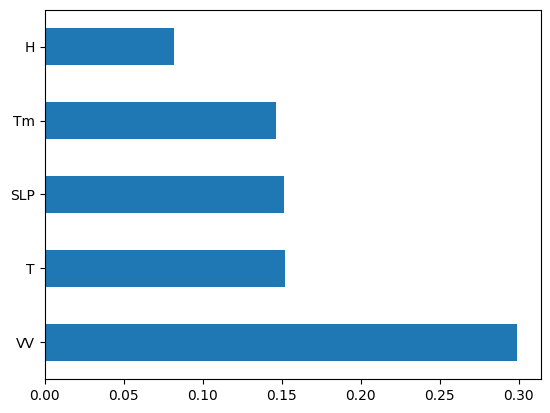

In [19]:


#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(5).plot(kind='barh')
plt.show()



/tmp/ipykernel_5852/2381035769.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(y)


<Axes: xlabel='PM 2.5', ylabel='Density'>

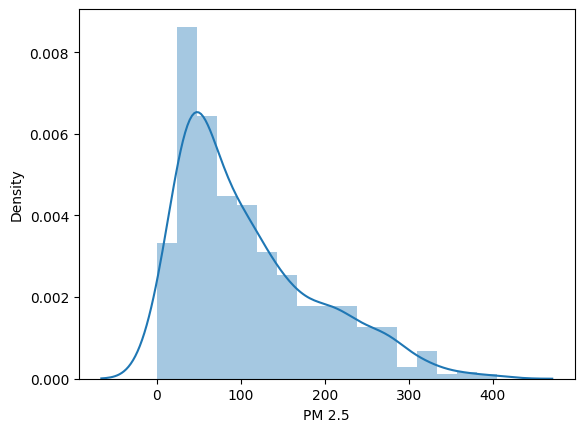

In [20]:


sns.distplot(y)



In [44]:


# Train Test split

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)





In [56]:

from sklearn.tree import DecisionTreeRegressor

dtree=DecisionTreeRegressor(criterion="squared_error")


In [57]:


dtree.fit(X_train,y_train)



DecisionTreeRegressor()

In [65]:
# training error

print("Coefficient of determination R^2 <-- on train set: {}".format(dtree.score(X_train, y_train)))

Coefficient of determination R^2 <-- on train set: 1.0


In [62]:
# true error

print("Coefficient of determination R^2 <-- on test set: {}".format(dtree.score(X_test, y_test)))

Coefficient of determination R^2 <-- on test set: 0.3719818591076237


In [67]:


from sklearn.model_selection import cross_val_score
score=cross_val_score(dtree,X,y,cv=5)



In [72]:


score.mean()



0.17087086713597466

In [73]:
import pydotplus
import graphviz

print("Both installed correctly!")

Both installed correctly!


In [81]:
# Tree Visualization


from IPython.display import Image  
from sklearn.tree import export_graphviz
from io import StringIO
import pydotplus
import os


In [78]:


features = list(df.columns[:-1])
features



['T', 'TM', 'Tm', 'SLP', 'H', 'VV', 'V', 'VM']

In [82]:
# OPTIONAL: Confirm dot is available
import shutil
print(shutil.which("dot"))

/usr/bin/dot


In [83]:
# Create Graphviz dot data
dot_data = StringIO()
export_graphviz(dtree, out_file=dot_data,
                feature_names=features,
                filled=True, rounded=True)

In [84]:
# Generate graph
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())


In [85]:

# Display image in notebook
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.764923 to fit



In [87]:

# Model Evaluation
# 
prediction=dtree.predict(X_test)

/tmp/ipykernel_5852/4169881724.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(y_test-prediction)


<Axes: xlabel='PM 2.5', ylabel='Density'>

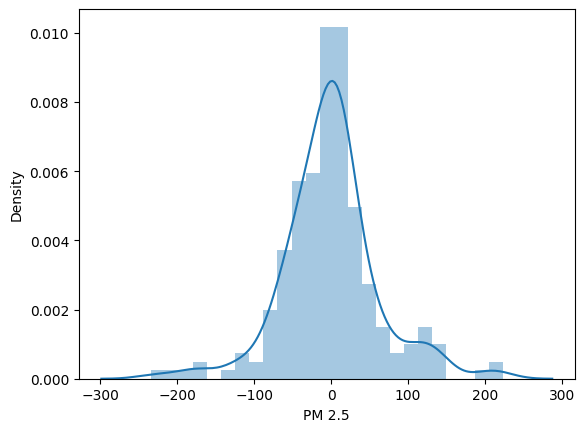

In [88]:


sns.distplot(y_test-prediction)



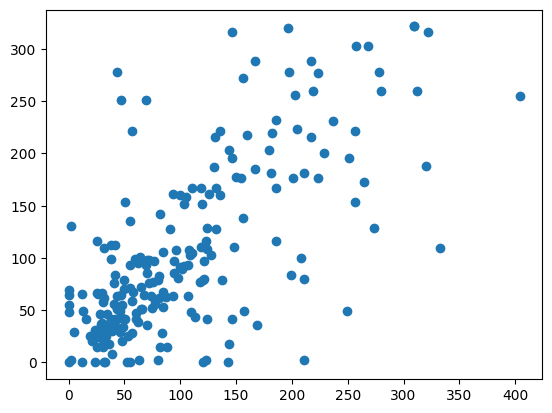

In [89]:


plt.scatter(y_test,prediction)



In [90]:
DecisionTreeRegressor()

DecisionTreeRegressor()